<a href="https://colab.research.google.com/github/IYashCanCode/Detectron2-Mask-Detection/blob/main/Flask_Mask_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<b><h1> Installing and loading necessary modules

In [ ]:
!git clone https://github.com/facebookresearch/detectron2.git

Cloning into 'detectron2'...
remote: Enumerating objects: 15303, done.
remote: Counting objects: 100% (28/28), done.
remote: Compressing objects: 100% (27/27), done.
remote: Total 15303 (delta 9), reused 12 (delta 1), pack-reused 15275
Receiving objects: 100% (15303/15303), 6.18 MiB | 5.53 MiB/s, done.
Resolving deltas: 100% (11120/11120), done.


In [ ]:
!git clone https://github.com/IYashCanCode/Detectron2-Mask-Detection.git

Cloning into 'Detectron2-Mask-Detection'...
remote: Enumerating objects: 506, done.
remote: Counting objects: 100% (67/67), done.
remote: Compressing objects: 100% (58/58), done.
remote: Total 506 (delta 31), reused 20 (delta 6), pack-reused 439
Receiving objects: 100% (506/506), 108.55 MiB | 13.71 MiB/s, done.
Resolving deltas: 100% (58/58), done.
Updating files: 100% (466/466), done.


In [ ]:
!pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-4u4tjgm0
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-4u4tjgm0
  Resolved https://github.com/facebookresearch/detectron2.git to commit 864913f0e57e87a75c8cc0c7d79ecbd774fc669b
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 1.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 21.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 62.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 19.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for detectron2: filename=detectron2-0.6-cp310-cp310-linux_x86_64.whl size=6119640 sha256=054005c555d3fafe52bba61e164b

In [ ]:
!pip install flask-ngrok

In [ ]:
!pip install pyngrok==4.1.1

  Preparing metadata (setup.py) ... done
  Created wheel for pyngrok: filename=pyngrok-4.1.1-py3-none-any.whl size=15963 sha256=e34519748d46ab1d6db0671e7b51d5fd729200dbf885db592e1faf7c4a34e611
  Stored in directory: /root/.cache/pip/wheels/4c/7c/4c/632fba2ea8e88d8890102eb07bc922e1ca8fa14db5902c91a8
Successfully built pyngrok


In [ ]:
!ngrok authtoken 2a4ehFCWleROHxdwX1Hs4jbZiv6_4oftNw8tzUjXn1UqWrEup

Authtoken saved to configuration file: /root/.ngrok2/ngrok.yml


In [ ]:
from detectron2 import model_zoo
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import ColorMode, Visualizer
from detectron2.structures import BoxMode
from detectron2.data.datasets import register_coco_instances
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.evaluation import COCOEvaluator, inference_on_dataset, LVISEvaluator
from detectron2.data import build_detection_test_loader
from detectron2.utils.logger import setup_logger
setup_logger()

import os
import cv2
import pickle
import random
from PIL import Image
import matplotlib.pyplot as plt
from flask_ngrok import run_with_ngrok
from flask import Flask,request,render_template,jsonify,send_file
from google.colab.patches import cv2_imshow

<h3><b>Registering Training images coco format

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("OD_Mask", {}, "/content/Detectron2-Mask-Detection/sample_train/train_.json", "/content/Detectron2-Mask-Detection/sample_train/images")

In [ ]:
OD_Mask_metadata = MetadataCatalog.get("OD_Mask")
dataset_dicts = DatasetCatalog.get("OD_Mask")

WARNING [01/10 14:44:30 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/10 14:44:30 d2.data.datasets.coco]: Loaded 337 images in COCO format from /content/Detectron2-Mask-Detection/sample_train/train_.json


<h3><b>Visualizing training images

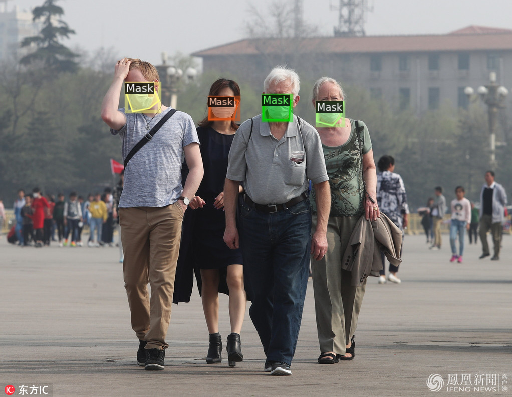

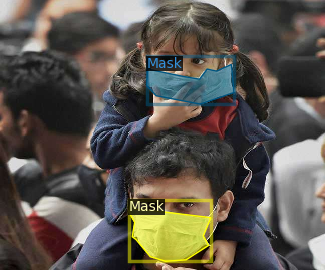

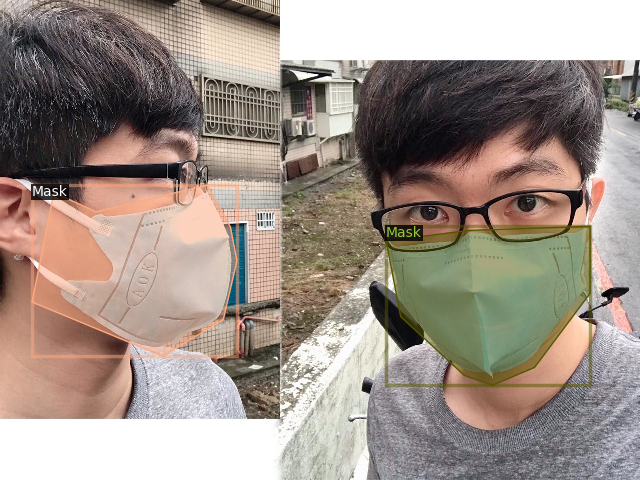

In [ ]:
import random

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=OD_Mask_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

<h3><b>Training Detectron2 detection model on custome dataset of mask detection

In [ ]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file('COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml'))
cfg.DATASETS.TRAIN = ("OD_Mask",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url('COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml')
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.001
cfg.SOLVER.LR_SCHEDULER_NAME = 'WarmupMultiStepLR'
cfg.MODEL.DEVICE='cuda'
cfg.SOLVER.GAMMA = 0.2
cfg.SOLVER.STEPS = []
cfg.SOLVER.MAX_ITER = 500
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.IOU_THRESHOLDS = [0.8]
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[01/10 14:51:31 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[01/10 14:51:31 d2.engine.train_loop]: Starting training from iteration 0
[01/10 14:51:46 d2.utils.events]:  eta: 0:05:38  iter: 19  total_loss: 1.913  loss_cls: 1.065  loss_box_reg: 0.005569  loss_mask: 0.684  loss_rpn_cls: 0.1278  loss_rpn_loc: 0.02279    time: 0.7038  last_time: 0.7328  data_time: 0.0517  last_data_time: 0.0050   lr: 3.8962e-05  max_mem: 4377M
[01/10 14:52:00 d2.utils.events]:  eta: 0:05:25  iter: 39  total_loss: 1.359  loss_cls: 0.6007  loss_box_reg: 0.004295  loss_mask: 0.6485  loss_rpn_cls: 0.07532  loss_rpn_loc: 0.01601    time: 0.7061  last_time: 0.5866  data_time: 0.0221  last_data_time: 0.0044   lr: 7.8922e-05  max_mem: 4378M
[01/10 14:52:15 d2.utils.events]:  eta: 0:05:14  iter: 59  total_loss: 0.8892  loss_cls: 0.2376  loss_box_reg: 0.01134  loss_mask: 0.5628  loss_rpn_cls: 0.05049  loss_rpn_loc: 0.01486    time: 0.7226  last_time: 0.7714  data_time: 0.0204  last_data_time: 0.0069   lr: 0.00011888  max_mem: 4379M
[01/10 14:52:30 d2.utils.events]:  eta: 0:04

<h3><b>Joining custom weights to the detectron model

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.75
cfg.DATASETS.TEST = ("OD_Mask", )
predictor = DefaultPredictor(cfg)

[01/10 14:57:52 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


In [ ]:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

<h3><b>Predicting the images of training using custom mask detection detectron2 model

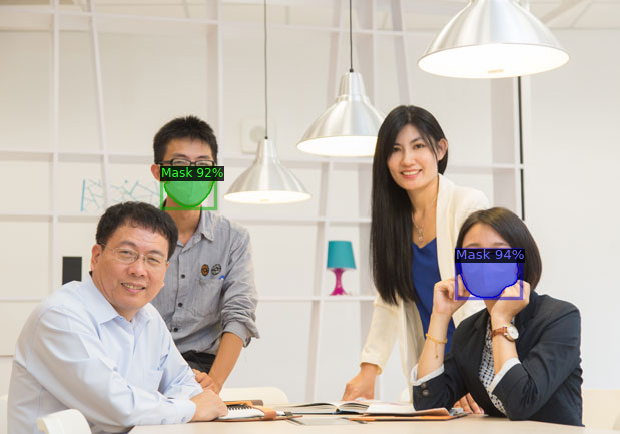

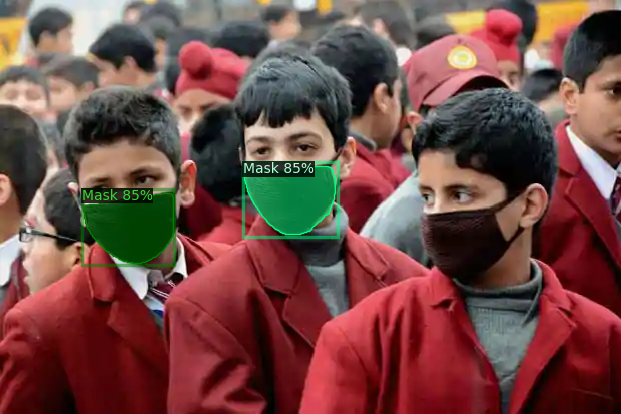

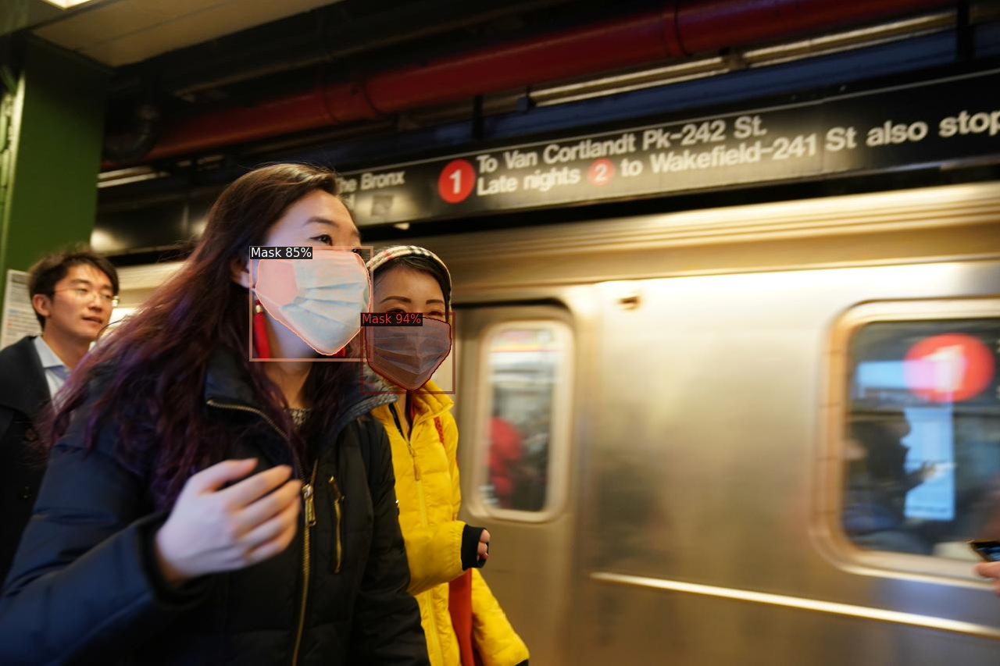

In [ ]:
for d in random.sample(dataset_dicts, 3):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=OD_Mask_metadata,
                   scale=1.,
                   instance_mode=ColorMode.IMAGE
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

<h2><b>Flask API for custom mask detection detectron2 model build on Flask and Python Ngrok library<br><br><h5><i><b>Please use the link which has ngrok written in its link. Example: http://2be7-34-125-28-215.ngrok-free.app

In [ ]:
app = Flask(__name__,template_folder='/content/Detectron2-Mask-Detection/templates')
run_with_ngrok(app)

@app.route('/')
def index():
    return render_template('index.html')

@app.route('/predict', methods=['POST'])
def predict():
    if 'file' not in request.files:
        return jsonify({'error': 'No file part'})

    file = request.files['file']

    if file.filename == '':
        return jsonify({'error': 'No selected file'})

    upload_path = 'uploads/' + file.filename
    file.save(upload_path)

    image = cv2.imread(upload_path)
    outputs = predictor(image)

    v = Visualizer(image[:, :, ::-1],
                metadata=OD_Mask_metadata,
                scale=1.,
                instance_mode=ColorMode.IMAGE)

    annotated_image = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    annotated_image.save('/content/uploads/annoted_'+file.filename)
    annotated_image = annotated_image.get_image()[:, :, ::-1]

    output_path = 'uploads/annoted_' + file.filename

    return jsonify({'annotated_image': output_path})

@app.route('/uploads/<filename>')
def uploaded_file(filename):
    return send_file('/content/uploads/' + filename, mimetype='image/jpeg')

if __name__ == '__main__':
    os.makedirs('uploads', exist_ok=True)

    app.run()

 * Serving Flask app '__main__'
 * Debug mode: off


INFO:werkzeug:WARNING: This is a development server. Do not use it in a production deployment. Use a production WSGI server instead.
 * Running on http://127.0.0.1:5000
INFO:werkzeug:Press CTRL+C to quit


 * Running on http://7fed-34-142-143-107.ngrok-free.app
 * Traffic stats available on http://127.0.0.1:4040


INFO:werkzeug:127.0.0.1 - - [10/Jan/2024 14:58:33] "GET / HTTP/1.1" 200 -
INFO:werkzeug:127.0.0.1 - - [10/Jan/2024 14:58:34] "GET /favicon.ico HTTP/1.1" 404 -
INFO:werkzeug:127.0.0.1 - - [10/Jan/2024 14:58:45] "POST /predict HTTP/1.1" 200 -
INFO:werkzeug:127.0.0.1 - - [10/Jan/2024 14:58:46] "GET /uploads/annoted_how-to-wear-face-mask-right-way.jpg HTTP/1.1" 200 -
